In [1]:
import pandas as pd
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import seaborn as sns

In [15]:
train_df = pd.read_csv(r"C:\Users\bindu\Desktop\nepal_earthquake\train_values.csv")
train_df.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other
0,802906,6,487,12198,2,30,6,5,t,r,...,0,0,0,0,0,0,0,0,0,0
1,28830,8,900,2812,2,10,8,7,o,r,...,0,0,0,0,0,0,0,0,0,0
2,94947,21,363,8973,2,10,5,5,t,r,...,0,0,0,0,0,0,0,0,0,0
3,590882,22,418,10694,2,10,6,5,t,r,...,0,0,0,0,0,0,0,0,0,0
4,201944,11,131,1488,3,30,8,9,t,r,...,0,0,0,0,0,0,0,0,0,0


In [16]:
labels = pd.read_csv(r"C:\Users\bindu\Desktop\nepal_earthquake\train_labels.csv")
labels.head()

,building_id,damage_grade
0,802906,3
1,28830,2
2,94947,3
3,590882,2
4,201944,3


In [17]:
test_df = pd.read_csv(r"C:\Users\bindu\Desktop\nepal_earthquake\test_values.csv")
test_df.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other
0,300051,17,596,11307,3,20,7,6,t,r,...,0,0,0,0,0,0,0,0,0,0
1,99355,6,141,11987,2,25,13,5,t,r,...,1,0,0,0,0,0,0,0,0,0
2,890251,22,19,10044,2,5,4,5,t,r,...,0,0,0,0,0,0,0,0,0,0
3,745817,26,39,633,1,0,19,3,t,r,...,0,0,1,0,0,0,0,0,0,0
4,421793,17,289,7970,3,15,8,7,t,r,...,0,0,0,0,0,0,0,0,0,0


In [40]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 260601 entries, 0 to 260600
Data columns (total 39 columns):
 #   Column                                  Non-Null Count   Dtype 
---  ------                                  --------------   ----- 
 0   building_id                             260601 non-null  int64 
 1   geo_level_1_id                          260601 non-null  int64 
 2   geo_level_2_id                          260601 non-null  int64 
 3   geo_level_3_id                          260601 non-null  int64 
 4   count_floors_pre_eq                     260601 non-null  int64 
 5   age                                     260601 non-null  int64 
 6   area_percentage                         260601 non-null  int64 
 7   height_percentage                       260601 non-null  int64 
 8   land_surface_condition                  260601 non-null  object
 9   foundation_type                         260601 non-null  object
 10  roof_type                               260601 non-null 

Categorical columns present in the dataset are :

    legal_ownership_status  
    land_surface_condition  
    foundation_type         
    roof_type               
    ground_floor_type       
    other_floor_type        
    position                
    plan_configuration      


In [18]:
train = train_df.merge(labels,left_on= 'building_id',right_on='building_id')

In [19]:
categorical_columns=['land_surface_condition','foundation_type','roof_type',
                                        'legal_ownership_status','ground_floor_type','other_floor_type','position','plan_configuration']

In [20]:
for col in categorical_columns:
    train[f'{col}_encoded'] = train[col].astype('category').cat.codes

for col in categorical_columns:
    test_df[f'{col}_encoded'] = test_df[col].astype('category').cat.codes

In [21]:
train.drop(columns=categorical_columns,inplace=True)
test_df.drop(columns=categorical_columns,inplace=True)

In [9]:
from sklearn.preprocessing import QuantileTransformer
quantile_normal = QuantileTransformer(output_distribution='normal')
quantile_uniform = QuantileTransformer(output_distribution='uniform')

from sklearn.preprocessing import MinMaxScaler
minmax = MinMaxScaler()

from sklearn.preprocessing import RobustScaler
robust = RobustScaler()

import numpy as np

def transform_data(data):
    data['geo_level_1_id'] = quantile_normal.fit_transform(data.loc[:,'geo_level_1_id':'geo_level_1_id'])
    data[['geo_level_2_id','geo_level_3_id']] = quantile_uniform.fit_transform(data[['geo_level_2_id','geo_level_3_id']])
    data['count_floors_pre_eq'] = minmax.fit_transform(data.loc[:,'count_floors_pre_eq':'count_floors_pre_eq'])
    data['age'] = robust.fit_transform(data.loc[:,'age':'age'])
    data[['area_percentage','height_percentage']] = np.log(data[['area_percentage','height_percentage']] + 1)
    enc_columns = [c+"_encoded" for c in categorical_columns]
    data[enc_columns] = minmax.fit_transform(data[enc_columns])
    return data

In [10]:
transformed_train = transform_data(train.copy())

geo_level_1_id, geo_level_2_id, geo_level_3_id (type: int): geographic region in which building exists, from largest (level 1) to most specific sub-region (level 3). Possible values: level 1: 0-30, level 2: 0-1427, level 3: 0-12567.

Let's find out in which geographic region most damage occurred ...

- 1 represents low damage
- 2 represents a medium amount of damage
- 3 represents almost complete destruction

In [22]:
geo_damage1 = train.groupby(['geo_level_1_id','damage_grade'])['building_id'].count().reset_index().rename(columns= {'building_id':'building_count'})
geo_damage1

,geo_level_1_id,damage_grade,building_count
0,0,1,337
1,0,2,3075
2,0,3,599
3,1,1,411
4,1,2,1985
...,...,...,...
87,29,2,349
88,29,3,39
89,30,1,252
90,30,2,2127


In [23]:
max_geo_damage1 = geo_damage1.loc[geo_damage1.groupby('geo_level_1_id')['building_count'].idxmax()]
max_geo_damage1

,geo_level_1_id,damage_grade,building_count
1,0,2,3075
4,1,2,1985
7,2,2,610
10,3,2,4550
13,4,2,11164
16,5,2,2014
19,6,2,16222
22,7,2,11273
26,8,3,9913
28,9,2,2733


Most damaged locations in geo_level_1_id

In [24]:
max_geo_damage1[max_geo_damage1['damage_grade'] == 3]

,geo_level_1_id,damage_grade,building_count
26,8,3,9913
53,17,3,17615
56,18,3,2331
65,21,3,8710
83,27,3,6060


non-engineered concrete damage vs engineered concrete damage vs other material damage

In [25]:
non_eng_concrete_damage = train.groupby(['has_superstructure_rc_non_engineered','damage_grade'])['building_id'].count().reset_index().rename(columns= {'building_id':'building_count'})

non_eng_concrete_damage

,has_superstructure_rc_non_engineered,damage_grade,building_count
0,0,1,21267
1,0,2,142427
2,0,3,85808
3,1,1,3857
4,1,2,5832
5,1,3,1410


In [26]:
eng_concrete_damage = train.groupby(['has_superstructure_rc_engineered','damage_grade'])['building_id'].count().reset_index().rename(columns= {'building_id':'building_count'})

eng_concrete_damage

,has_superstructure_rc_engineered,damage_grade,building_count
0,0,1,22468
1,0,2,146857
2,0,3,87143
3,1,1,2656
4,1,2,1402
5,1,3,75


In [27]:
oth_material_damage = train.groupby(['has_superstructure_other','damage_grade'])['building_id'].count().reset_index().rename(columns= {'building_id':'building_count'})

oth_material_damage

,has_superstructure_other,damage_grade,building_count
0,0,1,24468
1,0,2,146011
2,0,3,86217
3,1,1,656
4,1,2,2248
5,1,3,1001


Damage caused in non engineered concrete buildings, engineered concrete buildings and other material buildings

In [28]:
non_eng_damage = non_eng_concrete_damage[non_eng_concrete_damage['has_superstructure_rc_non_engineered'] == 1]
non_eng_damage['building_count'] =  non_eng_damage['building_count'] / non_eng_damage['building_count'].sum()

eng_damage = eng_concrete_damage[eng_concrete_damage['has_superstructure_rc_engineered'] == 1]
eng_damage['building_count'] =  eng_damage['building_count'] / eng_damage['building_count'].sum()

othr_damage = oth_material_damage[oth_material_damage['has_superstructure_other'] == 1]
othr_damage['building_count'] =  othr_damage['building_count'] / othr_damage['building_count'].sum()

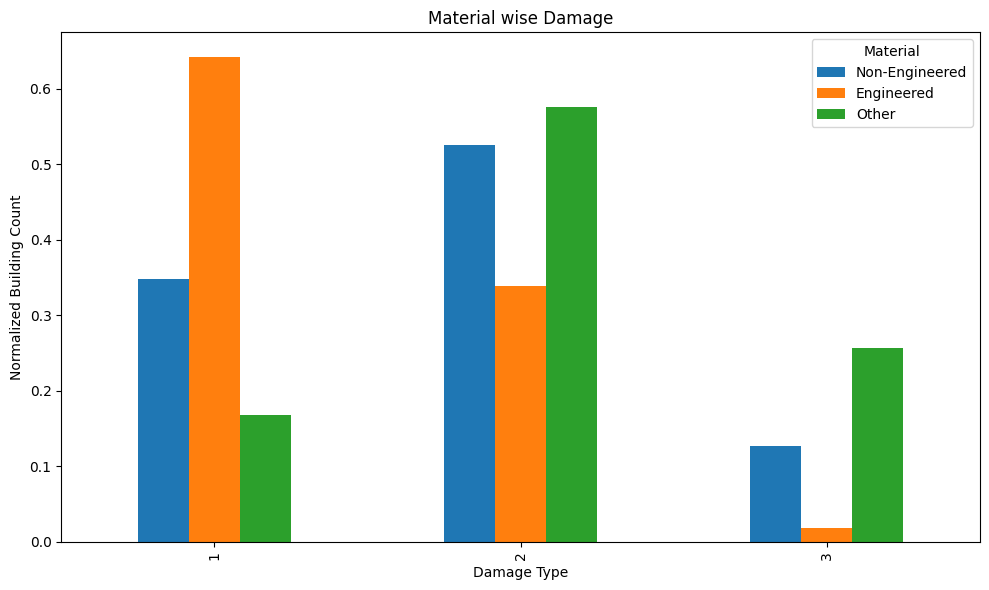

In [29]:
data_to_plot = pd.concat(
    [
        non_eng_damage['building_count'], 
        eng_damage['building_count'], 
        othr_damage['building_count']
    ],
    axis=1
)

data_to_plot.columns = ['Non-Engineered', 'Engineered', 'Other']

ax = data_to_plot.plot.bar(figsize=(10, 6))

ax.set_xticklabels(set(train['damage_grade']))
ax.set_xlabel('Damage Type')          
ax.set_ylabel('Normalized Building Count') 

# Set legend title
ax.legend(title='Material')

# Set title for the plot
plt.title('Material wise Damage')

# Show plot
plt.tight_layout()
plt.show()

Engineered concrete is least prone to damage, while other materials are most prone to damage.

In [30]:
floors_damage = train.groupby(['count_floors_pre_eq','damage_grade'])['building_id'].count().reset_index()

In [31]:
floors_damage['normalised_damage'] = floors_damage.groupby('count_floors_pre_eq')['building_id'].transform(lambda x: x/x.sum())

<Axes: xlabel='count_floors_pre_eq'>

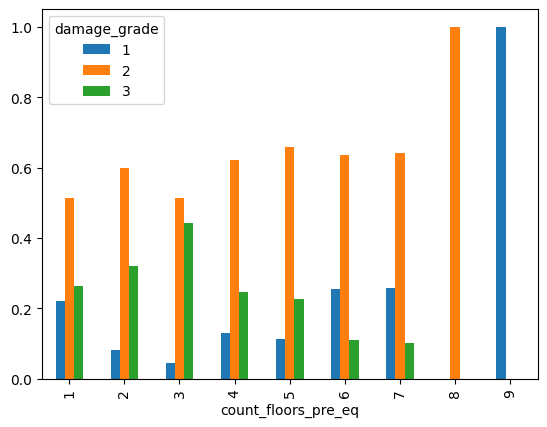

In [33]:
floors_damage.pivot(index='count_floors_pre_eq', columns='damage_grade', values='normalised_damage').plot(kind='bar')

According to data, Three-story houses are more prone to damage compared to buildings with other numbers of floors.

In [34]:
age_damage = train.groupby(['age','damage_grade'])['building_id'].count().reset_index()

In [35]:
age_damage['normalised_damage'] = age_damage.groupby('age')['building_id'].transform(lambda x: x/x.sum())

<Axes: xlabel='age'>

<Figure size 1500x1000 with 0 Axes>

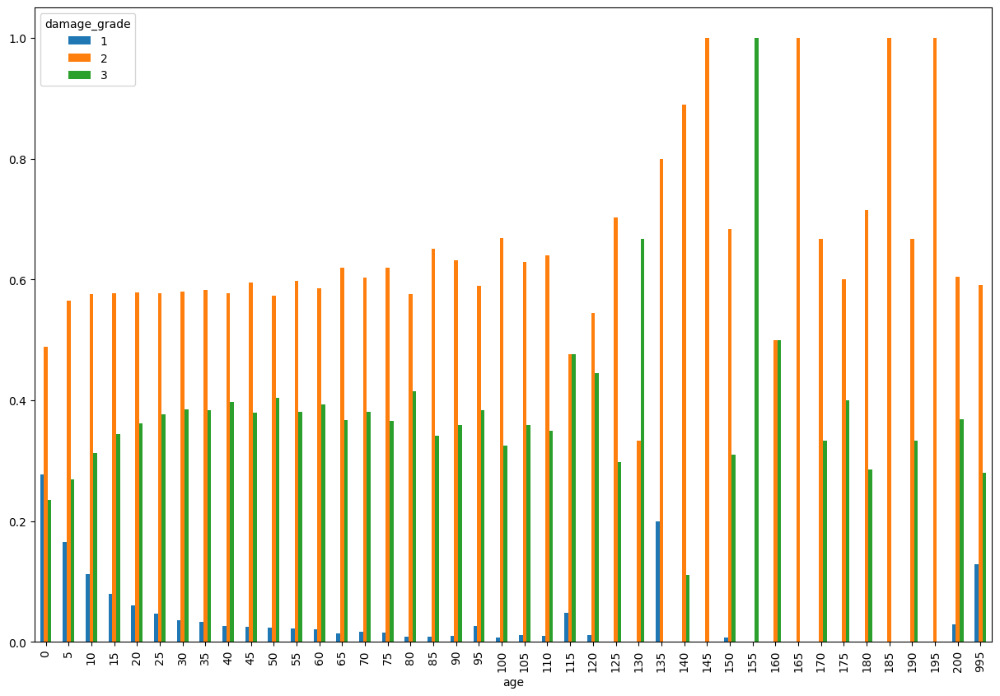

In [37]:
age_damage.pivot(index='age', columns='damage_grade', values='normalised_damage').plot(kind='bar',figsize=(15,10))

<Axes: xlabel='height_percentage', ylabel='area_percentage'>

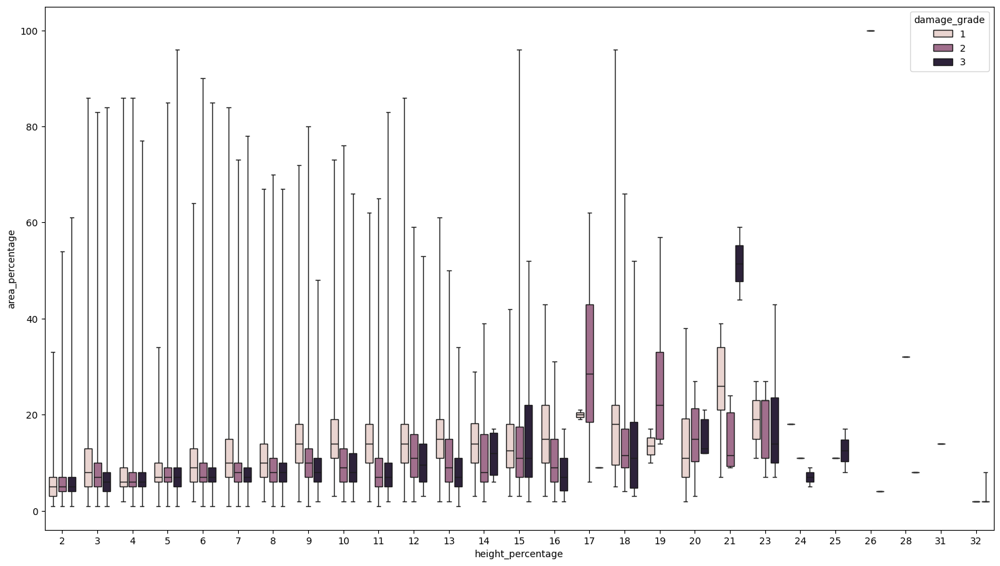

In [36]:
plt.figure(figsize = (18,10))
sns.boxplot(data=train, x="height_percentage", y="area_percentage", hue = "damage_grade", whis=(0,100),gap=0.2)

Most damage occurs if the height to area ratio of the building is unusual, with more height constructed in less area.

In [6]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter3d(
    x=train['height_percentage'],
    y=train['area_percentage'],
    z=train['damage_grade'],
    mode='markers',
    marker=dict(
        size=3,
        color=train['damage_grade'],   # Set color based on damage_grade
        colorscale='Viridis',       # Choose a color scale
        colorbar=dict(title='Damage Grade'),
        opacity=0.8
    )
)])

# Add axis labels
fig.update_layout(
    scene=dict(
        xaxis_title='Height Percentage',
        yaxis_title='Area Percentage',
        zaxis_title='Damage Grade'
    ),
    title="3D Scatter Plot of Height, Area, and Damage Grade",
    margin=dict(l=0, r=0, b=0, t=40)
)

# Show plot
fig.show()


In [37]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

y = train['damage_grade']
X = train.drop(columns = ['damage_grade','building_id'])

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)



In [38]:
from sklearn.ensemble import RandomForestClassifier

# Initialize and train model
model = RandomForestClassifier()
model.fit(X_train, y_train)

# Predict and evaluate
y_pred = model.predict(X_test)

f1_micro = f1_score(y_test, y_pred, average='micro')
f1_micro

0.7199191619447181

In [39]:
importances = model.feature_importances_

feature_importance = list(zip(X_train.columns, importances))

# Sort the list of tuples by importance (descending order)
feature_importance.sort(key=lambda x: x[1], reverse=True)

cs = 0
# features contributing less to the model evaluation
for feature, importance in feature_importance:
    cs += importance
    if cs > 0.95:
        print(feature)


has_secondary_use
has_superstructure_bamboo
has_superstructure_mud_mortar_brick
has_superstructure_stone_flag
has_secondary_use_agriculture
has_superstructure_rc_non_engineered
has_secondary_use_hotel
has_superstructure_other
has_superstructure_cement_mortar_stone
has_superstructure_rc_engineered
has_secondary_use_rental
has_secondary_use_other
has_secondary_use_industry
has_secondary_use_institution
has_secondary_use_school
has_secondary_use_health_post
has_secondary_use_use_police
has_secondary_use_gov_office


([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37],
 [Text(0, 0, 'geo_level_1_id'),
  Text(1, 0, 'geo_level_2_id'),
  Text(2, 0, 'geo_level_3_id'),
  Text(3, 0, 'count_floors_pre_eq'),
  Text(4, 0, 'age'),
  Text(5, 0, 'area_percentage'),
  Text(6, 0, 'height_percentage'),
  Text(7, 0, 'has_superstructure_adobe_mud'),
  Text(8, 0, 'has_superstructure_mud_mortar_stone'),
  Text(9, 0, 'has_superstructure_stone_flag'),
  Text(10, 0, 'has_superstructure_cement_mortar_stone'),
  Text(11, 0, 'has_superstructure_mud_mortar_brick'),
  Text(12, 0, 'has_superstructure_cement_mortar_brick'),
  Text(13, 0, 'has_superstructure_timber'),
  Text(14, 0, 'has_superstructure_bamboo'),
  Text(15, 0, 'has_superstructure_rc_non_engineered'),
  Text(16, 0, 'has_superstructure_rc_engineered'),
  Text(17, 0, 'has_superstructure_other'),
  Text(1

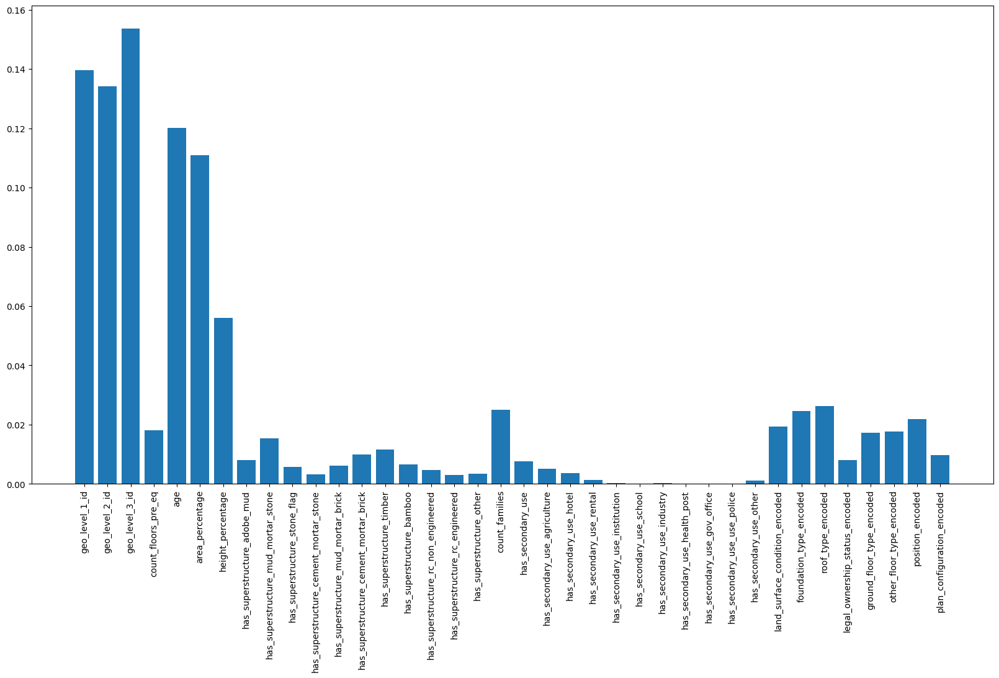

In [40]:
plt.figure(figsize=(20,10))
plt.bar(X_train.columns,importances)
plt.xticks(rotation=90)

In [41]:
from sklearn.ensemble import GradientBoostingClassifier

# Initialize and train model
model = GradientBoostingClassifier()
model.fit(X_train, y_train)

# Predict and evaluate
y_pred = model.predict(X_test)

f1_micro = f1_score(y_test, y_pred, average='micro')
f1_micro


0.6814059682019928

In [42]:
import torch
import torch.nn as nn
import torch.optim as optim

In [43]:
input_geo_data = torch.tensor(train[['geo_level_1_id','geo_level_2_id','geo_level_3_id']].to_numpy(), dtype=torch.long)

labels = torch.tensor(train['damage_grade'].to_numpy(), dtype=torch.long)

train.drop(columns='damage_grade',inplace=True)

In [44]:
class GeospatialEmbeddingModel(nn.Module):
    def __init__(self, geo_lv1_size, geo_lv2_size, geo_lv3_size, latent_dim):
        super(GeospatialEmbeddingModel, self).__init__()
        # Embedding layers
        self.geo_level1_embedding = nn.Embedding(geo_lv1_size, 16)
        self.geo_level2_embedding = nn.Embedding(geo_lv2_size, 128)
        self.geo_level3_embedding = nn.Embedding(geo_lv3_size, 128)

        # Initialize embeddings
        nn.init.uniform_(self.geo_level1_embedding.weight, -0.1, 0.1)
        nn.init.uniform_(self.geo_level2_embedding.weight, -0.1, 0.1)
        nn.init.uniform_(self.geo_level3_embedding.weight, -0.1, 0.1)

        # Compressor layer
        self.compressor = nn.Linear(16 + 128 + 128, latent_dim)
        
        # Batch Normalization
        self.batch_norm = nn.BatchNorm1d(latent_dim)
        
        # Output layer
        self.output = nn.Linear(latent_dim, 3)

    def forward(self, x):
        geo1_embedded = self.geo_level1_embedding(x[:, 0])
        geo2_embedded = self.geo_level2_embedding(x[:, 1])
        geo3_embedded = self.geo_level3_embedding(x[:, 2])

        concatenated = torch.cat([geo1_embedded, geo2_embedded, geo3_embedded], dim=1)
        compressed = torch.relu(self.compressor(concatenated))
        compressed = self.batch_norm(compressed)
        output = self.output(compressed)
        return output

geo_level_1_size, geo_level_2_size, geo_level_3_size = 31, 1428, 12568
latent_dim = 16

# Instantiate model
embds_model = GeospatialEmbeddingModel(geo_level_1_size, geo_level_2_size, geo_level_3_size, latent_dim)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()  
optimizer = optim.Adam(embds_model.parameters(), lr=0.0001)

# Training loop
num_epochs = 100 
for epoch in range(num_epochs):
    optimizer.zero_grad()  # Zero the gradients
    outputs = embds_model(input_geo_data)  # Forward pass
    loss = criterion(outputs, labels-1)  # Compute loss
    loss.backward()  # Backward pass
    optimizer.step()  # Update weights
    
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


Epoch [1/100], Loss: 1.1953
Epoch [2/100], Loss: 1.1869
Epoch [3/100], Loss: 1.1788
Epoch [4/100], Loss: 1.1708
Epoch [5/100], Loss: 1.1631
Epoch [6/100], Loss: 1.1555
Epoch [7/100], Loss: 1.1481
Epoch [8/100], Loss: 1.1410
Epoch [9/100], Loss: 1.1340
Epoch [10/100], Loss: 1.1271
Epoch [11/100], Loss: 1.1205
Epoch [12/100], Loss: 1.1140
Epoch [13/100], Loss: 1.1076
Epoch [14/100], Loss: 1.1014
Epoch [15/100], Loss: 1.0954
Epoch [16/100], Loss: 1.0896
Epoch [17/100], Loss: 1.0839
Epoch [18/100], Loss: 1.0783
Epoch [19/100], Loss: 1.0729
Epoch [20/100], Loss: 1.0677
Epoch [21/100], Loss: 1.0625
Epoch [22/100], Loss: 1.0575
Epoch [23/100], Loss: 1.0526
Epoch [24/100], Loss: 1.0478
Epoch [25/100], Loss: 1.0432
Epoch [26/100], Loss: 1.0386
Epoch [27/100], Loss: 1.0342
Epoch [28/100], Loss: 1.0298
Epoch [29/100], Loss: 1.0256
Epoch [30/100], Loss: 1.0214
Epoch [31/100], Loss: 1.0174
Epoch [32/100], Loss: 1.0134
Epoch [33/100], Loss: 1.0095
Epoch [34/100], Loss: 1.0057
Epoch [35/100], Loss: 1

Concatenate other features

In [45]:
train_2 = train.iloc[:,4:].to_numpy()
emdngs_ftrs = np.hstack((outputs.detach().numpy(), train_2))

In [46]:
class ClassificationModel(nn.Module):
    def __init__(self,input_dim):
        super(ClassificationModel, self).__init__()
        self.linear_relu_norm = nn.Sequential(
            nn.Linear(input_dim, 32),  
            nn.ReLU(),
            nn.BatchNorm1d(32),        
            nn.Dropout(0.3),           
            nn.Linear(32, 16),         
            nn.ReLU(),
            nn.Linear(16, 3)  
        )
        
    
    def forward(self, x):
        logits = self.linear_relu_norm(x)
        return logits


input_dim = emdngs_ftrs.shape[1]

classfication_model = ClassificationModel(input_dim)

In [47]:
# Loss and optimizer
criterion = nn.CrossEntropyLoss()  
optimizer = optim.Adam(classfication_model.parameters(), lr=0.0001)


num_epochs = 100 
for epoch in range(num_epochs):
    
    optimizer.zero_grad()  # Zero the gradients
    logits = classfication_model(torch.tensor(emdngs_ftrs,dtype=torch.float32))  # Forward pass
    loss = criterion(logits, labels-1)  # Compute loss
    loss.backward()  # Backward pass
    optimizer.step()  # Update weights
    
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


Epoch [1/100], Loss: 1.0683
Epoch [2/100], Loss: 1.0680
Epoch [3/100], Loss: 1.0679
Epoch [4/100], Loss: 1.0674
Epoch [5/100], Loss: 1.0666
Epoch [6/100], Loss: 1.0663
Epoch [7/100], Loss: 1.0657
Epoch [8/100], Loss: 1.0654
Epoch [9/100], Loss: 1.0651
Epoch [10/100], Loss: 1.0645
Epoch [11/100], Loss: 1.0641
Epoch [12/100], Loss: 1.0637
Epoch [13/100], Loss: 1.0633
Epoch [14/100], Loss: 1.0625
Epoch [15/100], Loss: 1.0622
Epoch [16/100], Loss: 1.0619
Epoch [17/100], Loss: 1.0614
Epoch [18/100], Loss: 1.0612
Epoch [19/100], Loss: 1.0608
Epoch [20/100], Loss: 1.0604
Epoch [21/100], Loss: 1.0599
Epoch [22/100], Loss: 1.0594
Epoch [23/100], Loss: 1.0591
Epoch [24/100], Loss: 1.0585
Epoch [25/100], Loss: 1.0583
Epoch [26/100], Loss: 1.0581
Epoch [27/100], Loss: 1.0573
Epoch [28/100], Loss: 1.0569
Epoch [29/100], Loss: 1.0565
Epoch [30/100], Loss: 1.0564
Epoch [31/100], Loss: 1.0561
Epoch [32/100], Loss: 1.0556
Epoch [33/100], Loss: 1.0551
Epoch [34/100], Loss: 1.0546
Epoch [35/100], Loss: 1

In [48]:
input_geo_data2 = torch.tensor(test_df[['geo_level_1_id','geo_level_2_id','geo_level_3_id']].to_numpy(), dtype=torch.long)
test_embds = embds_model(input_geo_data2)

In [49]:
test_2 = test_df.iloc[:,4:].to_numpy()
test_ftrs = np.hstack((test_embds.detach().numpy(), test_2))

In [50]:
test_logits = classfication_model(torch.tensor(test_ftrs,dtype=torch.float32))

In [51]:
pred_probab = nn.Softmax(dim=1)(test_logits)
y_pred_nn = pred_probab.argmax(1)

In [52]:
model = RandomForestClassifier()
model.fit(emdngs_ftrs, labels)

# Predict and evaluate
y_pred_rf = model.predict(test_ftrs)

In [53]:
from collections import Counter
Counter(y_pred_rf)

Counter({2: 54579, 3: 25507, 1: 6782})

In [54]:
sub = pd.DataFrame({'building_id' : test_df['building_id'],'damage_grade' : y_pred_rf})
sub.head()

,building_id,damage_grade
0,300051,2
1,99355,2
2,890251,3
3,745817,1
4,421793,2


In [55]:
sub.to_csv("geo_embdngs_rf.csv",index=False)